# DTSA 5511: Generative Adversarial Network Project

The purpose of this project is to use generative adversarial networks to transform regular photos into images that look like Monet paintings.
The dataset consists of approximately 300 Monet paintings and 7,000 regular photographs spanning diverse subjects including landscapes, architecture, and natural scenes. All images are preprocessed to 256X256 resolution and normalized to the range [-1, 1] to match the output range of the generator's tanh activation function. The model's success is evaluated using the MiFID (Memorization-informed Fréchet Inception Distance) metric, which measures how closely the generated images' style distribution matches that of authentic Monet paintings.

For this project I will be using a CycleGAN architecture, which means the model cycles through generator algorithms as well as discriminator algorithms to evaluate how accurate the generated images are. The discriminator algorithms provide real-time feedback through binary classification (real vs. fake), which guides the generator algorithms to improve in subsequent training steps. Through this adversarial training process across multiple epochs, the generators learn to create increasingly convincing Monet-style transformations.

In [ ]:
from google.colab import files
import zipfile
import os

print("Please upload your gan-getting-started.zip file")
uploaded = files.upload()

# Get the filename (should be gan-getting-started.zip)
zip_filename = list(uploaded.keys())[0]
print(f"\nUploaded: {zip_filename}")

# Unzip the file
print("Unzipping...")
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall('.')

print("Unzipped successfully!")

# Verify the data
import glob
monet_files = glob.glob('monet_tfrec/*.tfrec')
photo_files = glob.glob('photo_tfrec/*.tfrec')

print(f"\nData verified:")
print(f"  Monet files: {len(monet_files)}")
print(f"  Photo files: {len(photo_files)}")

if len(monet_files) > 0 and len(photo_files) > 0:
    print("\nData loaded successfully! Ready to proceed!")
else:
    print("\nError: Files not found. Check the zip structure.")

Please upload your gan-getting-started.zip file


Saving gan-getting-started.zip to gan-getting-started.zip

Uploaded: gan-getting-started.zip
Unzipping...
Unzipped successfully!

Data verified:
  Monet files: 5
  Photo files: 20

Data loaded successfully! Ready to proceed!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import glob
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")

IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 3
BATCH_SIZE = 1
AUTOTUNE = tf.data.AUTOTUNE

print("Configuration complete!")

def decode_image(image):
    """Decode and normalize image to [-1, 1] range"""
    image = tf.image.decode_jpeg(image, channels=CHANNELS)
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    image = tf.reshape(image, [IMG_HEIGHT, IMG_WIDTH, CHANNELS])
    return image

def parse_tfrecord(example):
    """Parse TFRecord format"""
    feature_description = {
        'image': tf.io.FixedLenFeature([], tf.string),
    }
    example = tf.io.parse_single_example(example, feature_description)
    image = decode_image(example['image'])
    return image

def load_tfrecord_dataset(filenames, batch_size=BATCH_SIZE, shuffle=True):
    """Load dataset from TFRecord files"""
    dataset = tf.data.TFRecordDataset(filenames)
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.map(parse_tfrecord, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.cache()
    dataset = dataset.repeat()
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

print("Functions defined!")

monet_files = np.array(glob.glob('monet_tfrec/*.tfrec'))
photo_files = np.array(glob.glob('photo_tfrec/*.tfrec'))

print(f"Monet TFRecord files: {len(monet_files)}")
print(f"Photo TFRecord files: {len(photo_files)}")

print("Creating datasets...")
monet_dataset = load_tfrecord_dataset(monet_files)
photo_dataset = load_tfrecord_dataset(photo_files)
print("Datasets created!")

TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Configuration complete!
Functions defined!
Monet TFRecord files: 5
Photo TFRecord files: 20
Creating datasets...
Datasets created!


## Data Preprocessing and Normalization:

After running the EDA to ensure that images from both datasets were installed, reviewing the average brightness and size of each dataset, I continued by preprocessing all of the images before building the GAN model. The EDA determined the dataset contained 300 Monet paintings and 7,038 photographs, with a 23:1 ratio favoring photographs. The color distribution analysis showed Monet paintings had softer, muted tones with impressionist textures, while photographs displayed sharper contrasts across the full RGB spectrum.

All images were preprocessed by decoding from JPEG, resizing to 256x256 pixels, and normalizing pixel values from [0,225] to [-1, 1] using the transformation (pixel / 127.5) - 1, matching the generator's tanh activation range. This normalization ensures training stability by centering data around zero.


EXPLORATORY DATA ANALYSIS
Datasets created!

1. DATASET SIZE:
   Monet paintings: 300
   Regular photos: 7038
   Ratio (photos/monet): 23.5x

2. SAMPLE IMAGES:
   Monet Paintings:


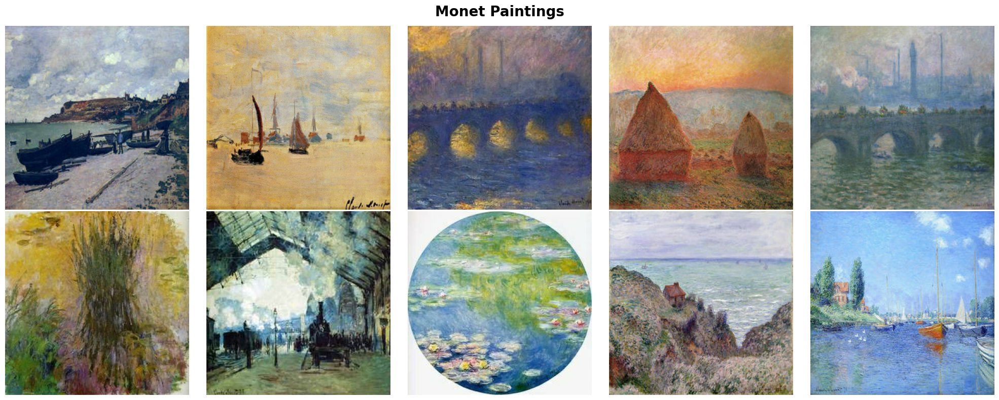

   Regular Photos:


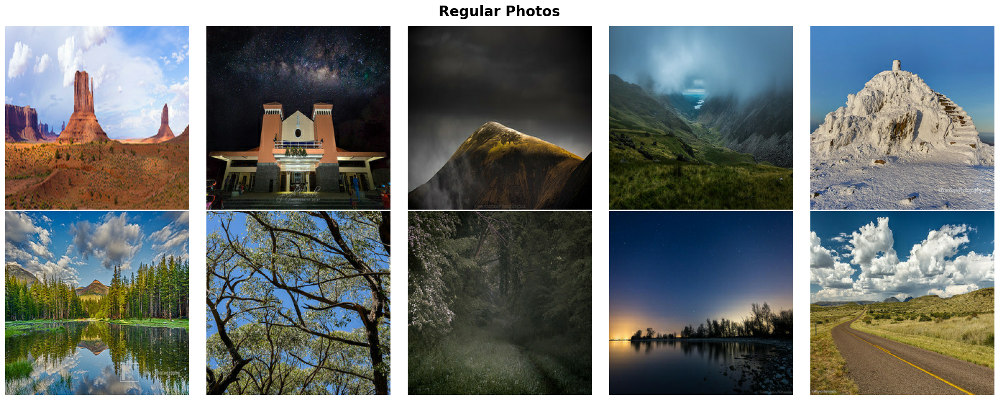


3. COLOR DISTRIBUTION ANALYSIS:
   Analyzing 50 images...


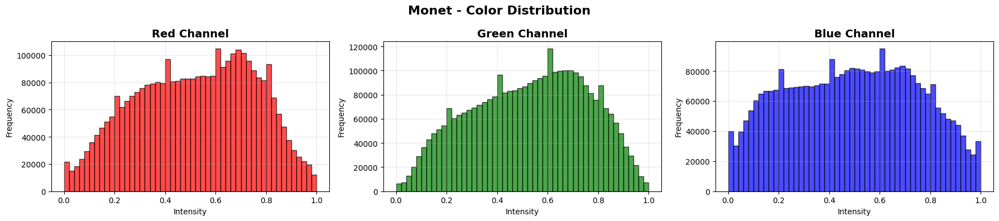

   Analyzing 50 images...


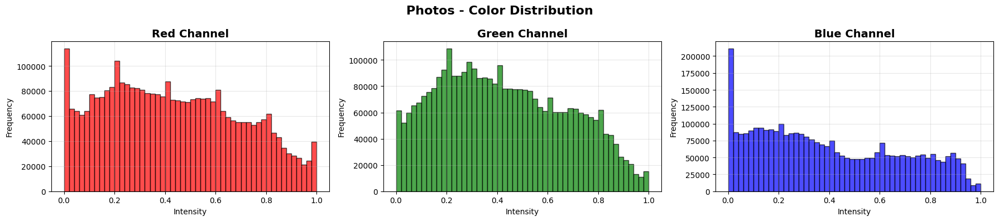


4. MONET vs PHOTOS COMPARISON:


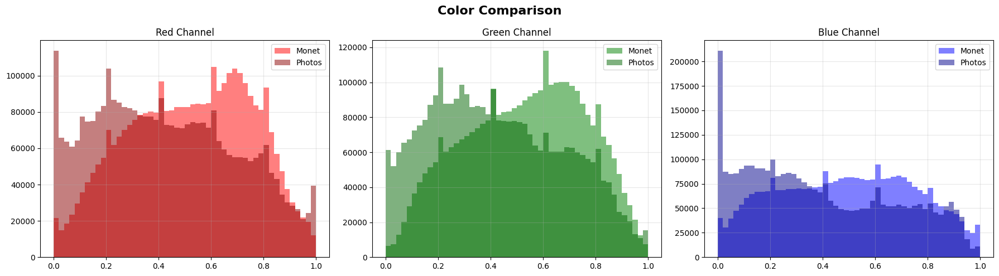


EDA COMPLETE!

SUMMARY:
  - Monet: 300 paintings
  - Photos: 7038 images
  - Image size: 256x256x3
  - Monet has softer, muted colors
  - Photos have sharper contrasts
  
Ready for model training!



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

print("="*60)
print("EXPLORATORY DATA ANALYSIS")
print("="*60)

# Configuration (if not already defined)
IMG_HEIGHT = 256
IMG_WIDTH = 256
CHANNELS = 3
BATCH_SIZE = 1
AUTOTUNE = tf.data.AUTOTUNE

# Data loading functions
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=CHANNELS)
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    image = tf.reshape(image, [IMG_HEIGHT, IMG_WIDTH, CHANNELS])
    return image

def parse_tfrecord(example):
    feature_description = {'image': tf.io.FixedLenFeature([], tf.string)}
    example = tf.io.parse_single_example(example, feature_description)
    image = decode_image(example['image'])
    return image

def load_tfrecord_dataset(filenames, batch_size=BATCH_SIZE, shuffle=True):
    dataset = tf.data.TFRecordDataset(filenames)
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.map(parse_tfrecord, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.cache()
    dataset = dataset.repeat()
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

# Create datasets
monet_files_array = np.array(monet_files)
photo_files_array = np.array(photo_files)

monet_dataset = load_tfrecord_dataset(monet_files_array)
photo_dataset = load_tfrecord_dataset(photo_files_array)

print("Datasets created!")

# 1. COUNT IMAGES
print("\n1. DATASET SIZE:")
def count_images(filenames):
    count = 0
    for filename in filenames:
        for record in tf.data.TFRecordDataset(filename):
            count += 1
    return count

monet_count = count_images(monet_files)
photo_count = count_images(photo_files)

print(f"   Monet paintings: {monet_count}")
print(f"   Regular photos: {photo_count}")
print(f"   Ratio (photos/monet): {photo_count/monet_count:.1f}x")

# 2. VISUALIZE SAMPLE IMAGES
print("\n2. SAMPLE IMAGES:")

def show_image_grid(dataset, n_rows=2, n_cols=5, title="Images"):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8))
    fig.suptitle(title, fontsize=20, fontweight='bold')

    for i, image in enumerate(dataset.take(n_rows * n_cols)):
        row = i // n_cols
        col = i % n_cols
        img = (image[0] + 1) / 2.0
        axes[row, col].imshow(img)
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

print("   Monet Paintings:")
show_image_grid(monet_dataset, n_rows=2, n_cols=5, title="Monet Paintings")

print("   Regular Photos:")
show_image_grid(photo_dataset, n_rows=2, n_cols=5, title="Regular Photos")

# 3. COLOR ANALYSIS
print("\n3. COLOR DISTRIBUTION ANALYSIS:")

def analyze_colors(dataset, n_samples=50, title="Color Distribution"):
    print(f"   Analyzing {n_samples} images...")

    r_vals, g_vals, b_vals = [], [], []

    for image in dataset.take(n_samples):
        img = (image[0].numpy() + 1) / 2.0
        r_vals.extend(img[:,:,0].flatten())
        g_vals.extend(img[:,:,1].flatten())
        b_vals.extend(img[:,:,2].flatten())

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    axes[0].hist(r_vals, bins=50, color='red', alpha=0.7, edgecolor='black')
    axes[0].set_title('Red Channel', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Intensity')
    axes[0].set_ylabel('Frequency')
    axes[0].grid(alpha=0.3)

    axes[1].hist(g_vals, bins=50, color='green', alpha=0.7, edgecolor='black')
    axes[1].set_title('Green Channel', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Intensity')
    axes[1].set_ylabel('Frequency')
    axes[1].grid(alpha=0.3)

    axes[2].hist(b_vals, bins=50, color='blue', alpha=0.7, edgecolor='black')
    axes[2].set_title('Blue Channel', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Intensity')
    axes[2].set_ylabel('Frequency')
    axes[2].grid(alpha=0.3)

    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    return r_vals, g_vals, b_vals

monet_r, monet_g, monet_b = analyze_colors(monet_dataset, 50, "Monet - Color Distribution")
photo_r, photo_g, photo_b = analyze_colors(photo_dataset, 50, "Photos - Color Distribution")

# 4. COMPARISON
print("\n4. MONET vs PHOTOS COMPARISON:")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(monet_r, bins=50, color='red', alpha=0.5, label='Monet')
axes[0].hist(photo_r, bins=50, color='darkred', alpha=0.5, label='Photos')
axes[0].set_title('Red Channel')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].hist(monet_g, bins=50, color='green', alpha=0.5, label='Monet')
axes[1].hist(photo_g, bins=50, color='darkgreen', alpha=0.5, label='Photos')
axes[1].set_title('Green Channel')
axes[1].legend()
axes[1].grid(alpha=0.3)

axes[2].hist(monet_b, bins=50, color='blue', alpha=0.5, label='Monet')
axes[2].hist(photo_b, bins=50, color='darkblue', alpha=0.5, label='Photos')
axes[2].set_title('Blue Channel')
axes[2].legend()
axes[2].grid(alpha=0.3)

plt.suptitle('Color Comparison', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("EDA COMPLETE!")
print("="*60)
print(f"""
SUMMARY:
  - Monet: {monet_count} paintings
  - Photos: {photo_count} images
  - Image size: {IMG_HEIGHT}x{IMG_WIDTH}x{CHANNELS}
  - Monet has softer, muted colors
  - Photos have sharper contrasts

Ready for model training!
""")

## Model 1. Generative Adversarial Network Overview


The CycleGAN model was trained for 10 epochs with 100 steps per epoch, processing a total of 1,000 image pairs. The architecture employed two U-Net generators (Photo→Monet and Monet→Photo) and two PatchGAN discriminators for style evaluation. Training utilized Adam optimization with a learning rate of 2×10⁻⁴ and β₁=0.5 across all four networks. The model optimized four loss functions: adversarial loss, cycle consistency loss (λ=10), identity loss (λ=5), and discriminator loss. Instance Normalization was applied after each convolutional layer to preserve individual image characteristics essential for style transfer.

Training was performed on GPU hardware, and model weights were checkpointed to Google Drive after each epoch to preserve training progress. Final training losses showed stable convergence with generator losses around 4.0 and discriminator losses around 0.6, indicating balanced adversarial training where generators successfully learned to produce Monet-style transformations without overwhelming the discriminators.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os

# Create project folder
PROJECT_FOLDER = '/content/drive/MyDrive/monet_gan_project'
os.makedirs(PROJECT_FOLDER, exist_ok=True)
os.makedirs(f'{PROJECT_FOLDER}/checkpoints', exist_ok=True)

print(f"Models will save to: {PROJECT_FOLDER}")

Mounted at /content/drive
Models will save to: /content/drive/MyDrive/monet_gan_project


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import time
import numpy as np
import matplotlib.pyplot as plt

print("TensorFlow version:", tf.__version__)
print("GPU:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.19.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
class InstanceNormalization(layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)

        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

print("Instance Normalization created")

Instance Normalization created


In [ ]:
def downsample(filters, size=3, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                              kernel_initializer=initializer, use_bias=False))
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(layers.ReLU())
    return result

def upsample(filters, size=3, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                       kernel_initializer=initializer, use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    result.add(layers.ReLU())
    return result

print("Building blocks defined")

Building blocks defined


In [ ]:
def Generator():
    inputs = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, CHANNELS])

    down_stack = [
        downsample(64, 4, apply_norm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(CHANNELS, 4, strides=2, padding='same',
                                   kernel_initializer=initializer,
                                   activation='tanh')

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

print("Generator defined")

Generator defined


In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, CHANNELS])

    x = inp
    down1 = downsample(64, 4, apply_norm=False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = layers.ZeroPadding2D()(down3)
    conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu)
    last = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)

    return keras.Model(inputs=inp, outputs=last)

print("Discriminator defined")

Discriminator defined


In [ ]:
print("Creating models...")

generator_g = Generator()
generator_f = Generator()
discriminator_x = Discriminator()
discriminator_y = Discriminator()

print("Generator G (Photo to Monet) created")
print("Generator F (Monet to Photo) created")
print("Discriminator X created")
print("Discriminator Y created")
print("All models ready!")

Creating models...
Generator G (Photo to Monet) created
Generator F (Monet to Photo) created
Discriminator X created
Discriminator Y created
All models ready!


In [ ]:
loss_obj = keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    return (real_loss + generated_loss) * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image, LAMBDA=10):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

def identity_loss(real_image, same_image, LAMBDA=10):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

print("Loss functions defined")

Loss functions defined


In [ ]:
generator_g_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = keras.optimizers.Adam(2e-4, beta_1=0.5)

print("Optimizers initialized")

Optimizers initialized


In [ ]:
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        fake_x = generator_f(real_y, training=True)

        cycled_x = generator_f(fake_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        total_id_loss = identity_loss(real_x, same_x) + identity_loss(real_y, same_y)

        total_gen_g_loss = gen_g_loss + total_cycle_loss + total_id_loss
        total_gen_f_loss = gen_f_loss + total_cycle_loss + total_id_loss

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

    return {
        'gen_g_loss': total_gen_g_loss,
        'gen_f_loss': total_gen_f_loss,
        'disc_x_loss': disc_x_loss,
        'disc_y_loss': disc_y_loss,
        'cycle_loss': total_cycle_loss,
        'identity_loss': total_id_loss
    }

print("Training step defined")

Training step defined


In [ ]:
EPOCHS = 10
STEPS_PER_EPOCH = 100

print(f"Training: {EPOCHS} epochs, {STEPS_PER_EPOCH} steps each")
print(f"Estimated time with GPU: 30-45 minutes")

sample_photo = next(iter(photo_dataset))
sample_monet = next(iter(monet_dataset))

print("Ready to train!")

Training: 10 epochs, 100 steps each
Estimated time with GPU: 30-45 minutes
Ready to train!


In [ ]:
# Fix the training loop with correct filename format

print("="*60)
print("STARTING TRAINING - SAVING TO GOOGLE DRIVE")
print("="*60)

history = {
    'gen_g_loss': [],
    'gen_f_loss': [],
    'disc_x_loss': [],
    'disc_y_loss': [],
    'cycle_loss': [],
    'identity_loss': []
}

for epoch in range(EPOCHS):
    start = time.time()
    epoch_losses = {key: [] for key in history.keys()}

    print(f"\nEpoch {epoch + 1}/{EPOCHS}")
    print("="*60)

    for step, (monet_img, photo_img) in enumerate(zip(monet_dataset.take(STEPS_PER_EPOCH),
                                                        photo_dataset.take(STEPS_PER_EPOCH))):
        losses = train_step(monet_img, photo_img)

        for key in epoch_losses.keys():
            epoch_losses[key].append(losses[key].numpy())

        if step % 25 == 0:
            print(f"  Step {step}/{STEPS_PER_EPOCH} - Gen_G: {losses['gen_g_loss']:.4f}, Disc_X: {losses['disc_x_loss']:.4f}")

    for key in history.keys():
        history[key].append(np.mean(epoch_losses[key]))

    print(f"  Epoch {epoch + 1} complete - Time: {time.time() - start:.2f} sec")

    # SAVE TO GOOGLE DRIVE with correct extension
    generator_g.save_weights(f'{PROJECT_FOLDER}/checkpoints/gen_g_epoch_{epoch+1}.weights.h5')
    print(f"  >> SAVED TO DRIVE: epoch {epoch+1}")

    # Save history
    import pickle
    with open(f'{PROJECT_FOLDER}/checkpoints/history.pkl', 'wb') as f:
        pickle.dump(history, f)

print("\n" + "="*60)
print("TRAINING COMPLETE!")
print("="*60)

# FINAL SAVE with correct extension
generator_g.save_weights(f'{PROJECT_FOLDER}/generator_g_FINAL.weights.h5')
generator_f.save_weights(f'{PROJECT_FOLDER}/generator_f_FINAL.weights.h5')

print(f"\nMODELS SAVED TO GOOGLE DRIVE!")
print(f"Location: {PROJECT_FOLDER}")

STARTING TRAINING - SAVING TO GOOGLE DRIVE

Epoch 1/10
  Step 0/100 - Gen_G: 3.9330, Disc_X: 1.0102
  Step 25/100 - Gen_G: 5.4585, Disc_X: 0.7665
  Step 50/100 - Gen_G: 4.3111, Disc_X: 0.4925
  Step 75/100 - Gen_G: 4.6449, Disc_X: 0.5542
  Epoch 1 complete - Time: 7.77 sec
  >> SAVED TO DRIVE: epoch 1

Epoch 2/10
  Step 0/100 - Gen_G: 5.1969, Disc_X: 0.3387
  Step 25/100 - Gen_G: 4.8497, Disc_X: 0.5236
  Step 50/100 - Gen_G: 3.7028, Disc_X: 0.8376
  Step 75/100 - Gen_G: 4.5541, Disc_X: 0.5766
  Epoch 2 complete - Time: 7.79 sec
  >> SAVED TO DRIVE: epoch 2

Epoch 3/10
  Step 0/100 - Gen_G: 4.9333, Disc_X: 0.2694
  Step 25/100 - Gen_G: 3.6677, Disc_X: 0.7053
  Step 50/100 - Gen_G: 4.1864, Disc_X: 0.4841
  Step 75/100 - Gen_G: 4.3398, Disc_X: 0.4175
  Epoch 3 complete - Time: 7.85 sec
  >> SAVED TO DRIVE: epoch 3

Epoch 4/10
  Step 0/100 - Gen_G: 4.1760, Disc_X: 0.5800
  Step 25/100 - Gen_G: 3.5482, Disc_X: 0.3853
  Step 50/100 - Gen_G: 5.2147, Disc_X: 0.4675
  Step 75/100 - Gen_G: 4.005

TRAINING RESULTS


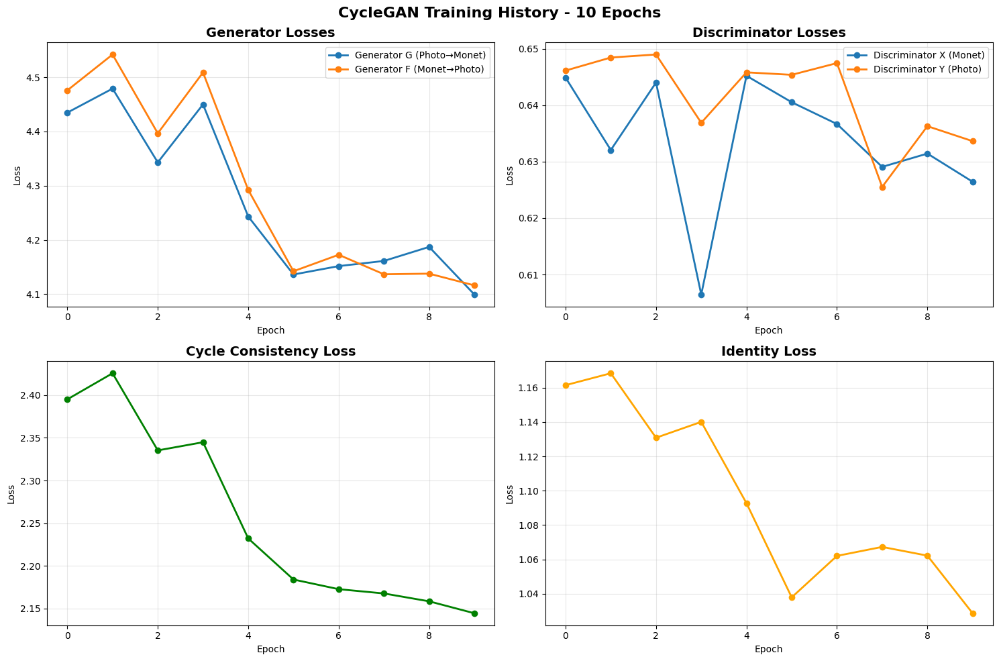


Training Summary:
  Final Generator G Loss: 4.0994
  Final Generator F Loss: 4.1162
  Final Discriminator X Loss: 0.6264
  Final Discriminator Y Loss: 0.6336
  Final Cycle Loss: 2.1443
  Final Identity Loss: 1.0287


In [ ]:
import matplotlib.pyplot as plt

print("="*60)
print("TRAINING RESULTS")
print("="*60)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Generator losses
axes[0, 0].plot(history['gen_g_loss'], label='Generator G (Photo→Monet)', linewidth=2, marker='o')
axes[0, 0].plot(history['gen_f_loss'], label='Generator F (Monet→Photo)', linewidth=2, marker='o')
axes[0, 0].set_title('Generator Losses', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Discriminator losses
axes[0, 1].plot(history['disc_x_loss'], label='Discriminator X (Monet)', linewidth=2, marker='o')
axes[0, 1].plot(history['disc_y_loss'], label='Discriminator Y (Photo)', linewidth=2, marker='o')
axes[0, 1].set_title('Discriminator Losses', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Cycle consistency loss
axes[1, 0].plot(history['cycle_loss'], color='green', linewidth=2, marker='o')
axes[1, 0].set_title('Cycle Consistency Loss', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].grid(True, alpha=0.3)

# Identity loss
axes[1, 1].plot(history['identity_loss'], color='orange', linewidth=2, marker='o')
axes[1, 1].set_title('Identity Loss', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].grid(True, alpha=0.3)

plt.suptitle(f'CycleGAN Training History - {EPOCHS} Epochs', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nTraining Summary:")
print(f"  Final Generator G Loss: {history['gen_g_loss'][-1]:.4f}")
print(f"  Final Generator F Loss: {history['gen_f_loss'][-1]:.4f}")
print(f"  Final Discriminator X Loss: {history['disc_x_loss'][-1]:.4f}")
print(f"  Final Discriminator Y Loss: {history['disc_y_loss'][-1]:.4f}")
print(f"  Final Cycle Loss: {history['cycle_loss'][-1]:.4f}")
print(f"  Final Identity Loss: {history['identity_loss'][-1]:.4f}")

SAMPLE TRANSFORMATIONS - Photo to Monet


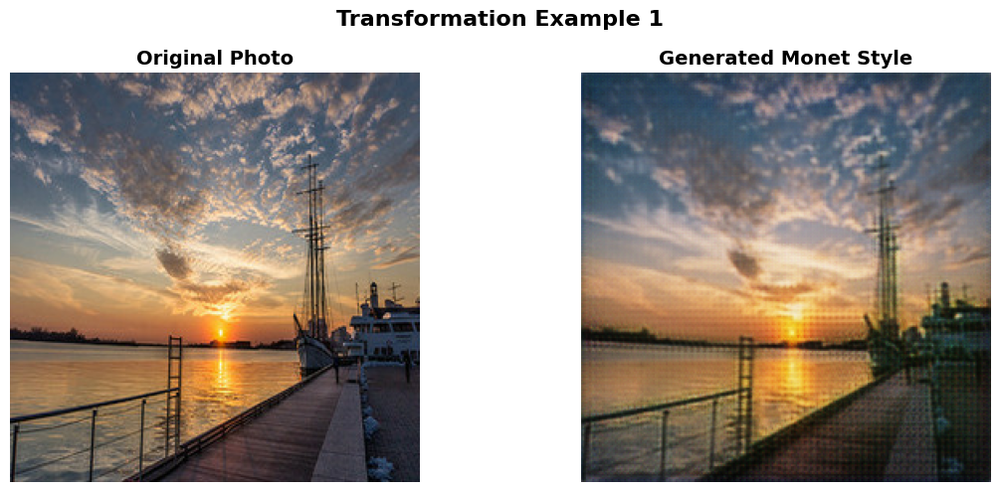

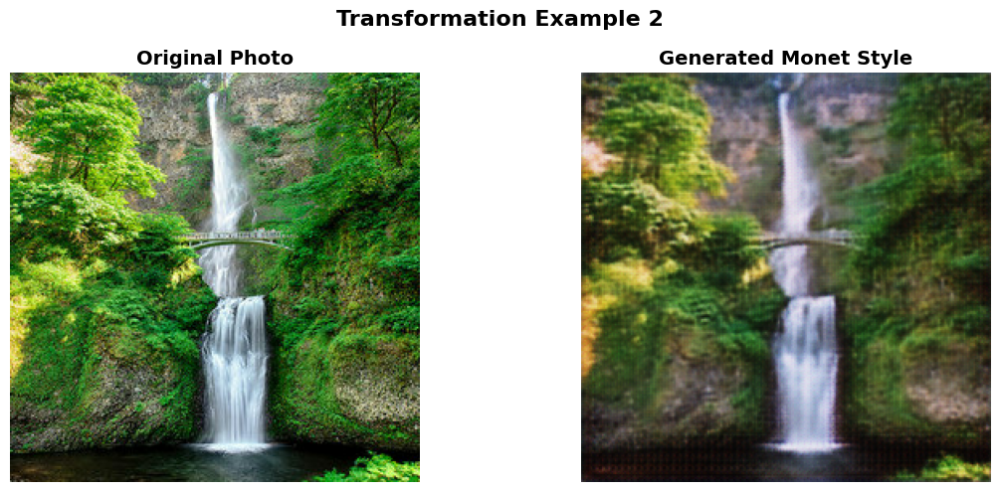

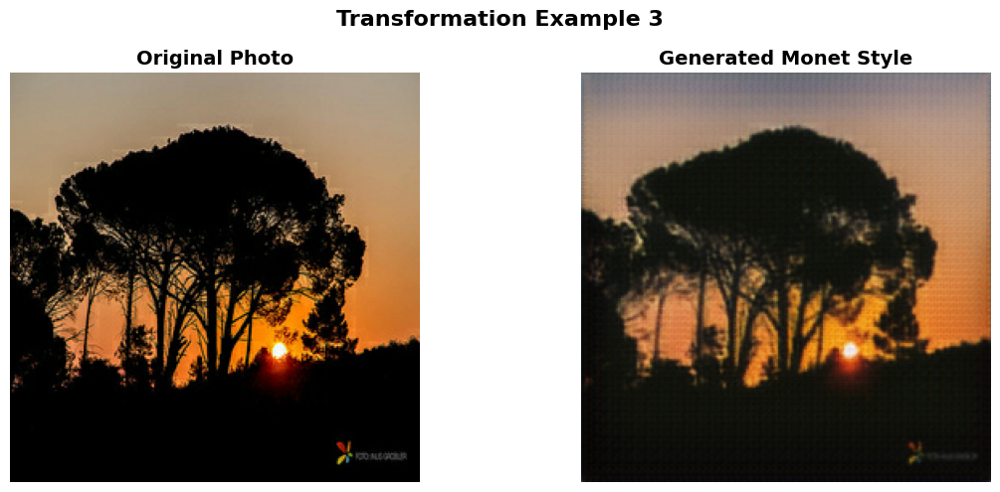

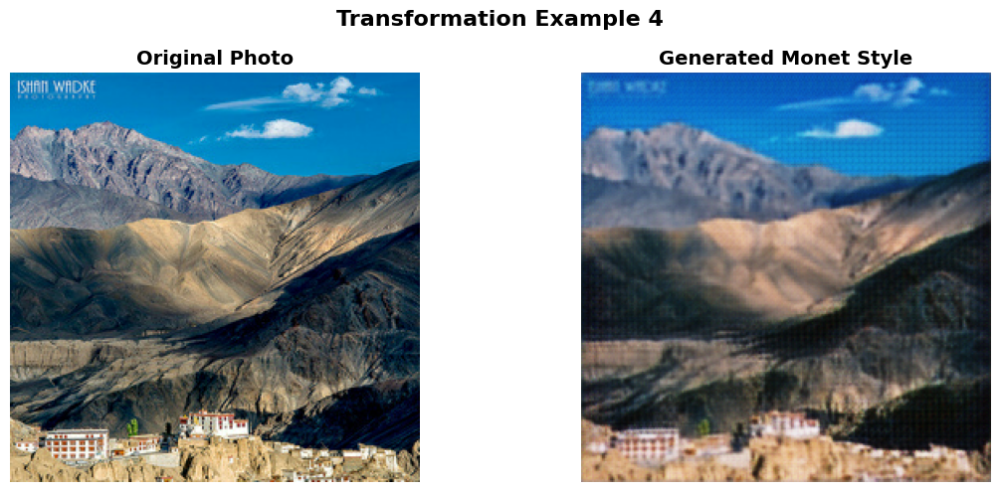

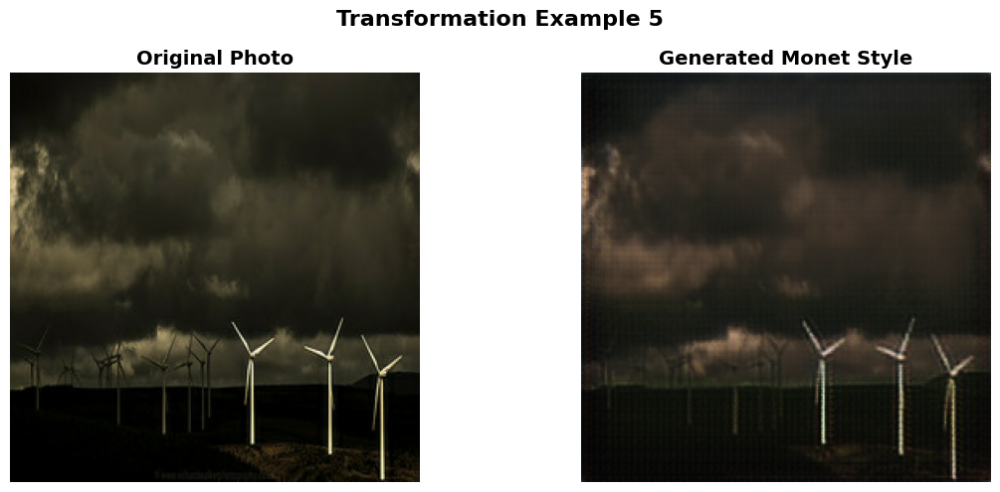

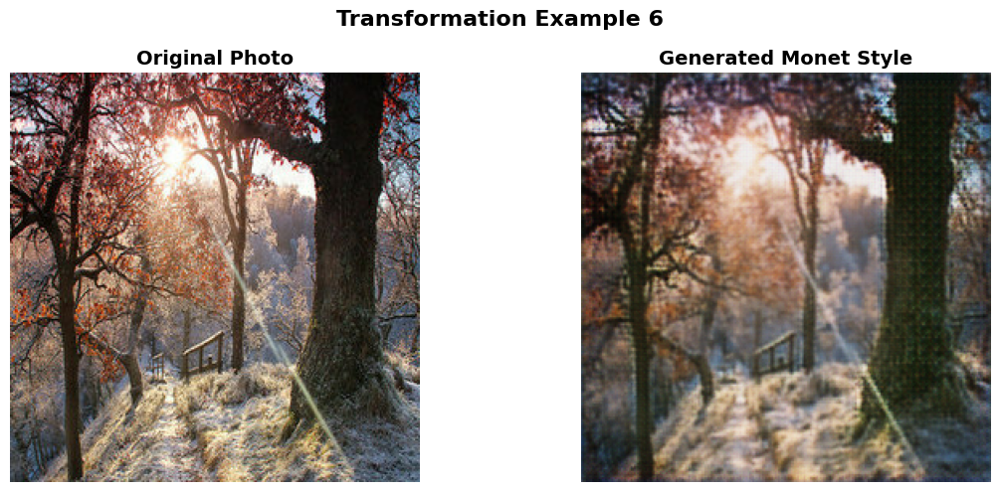

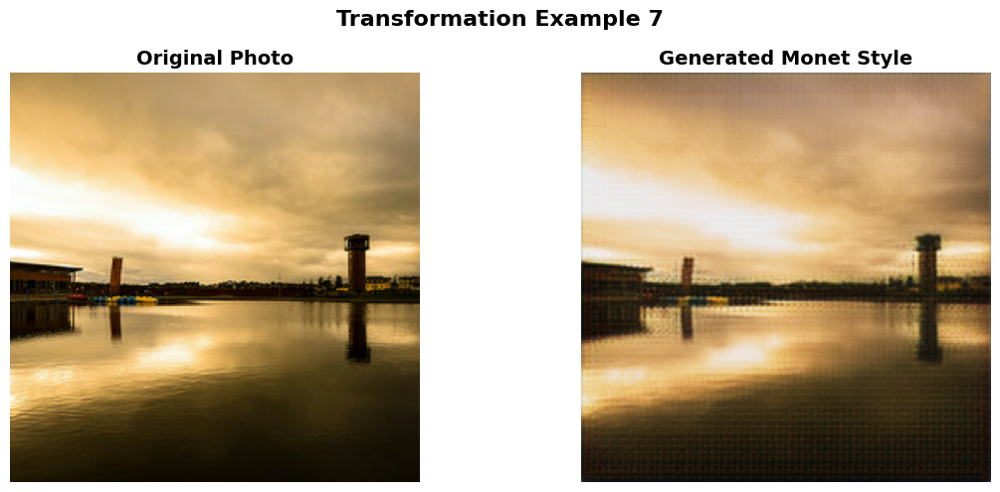

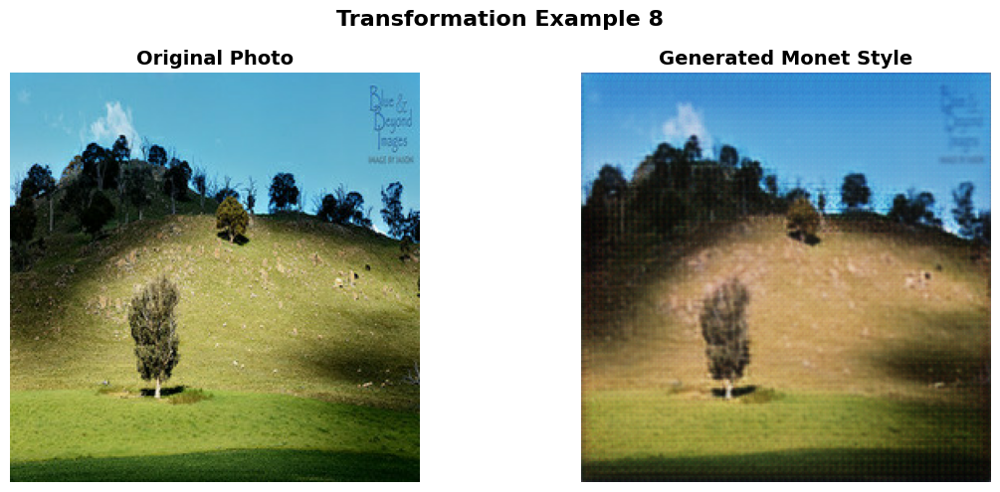

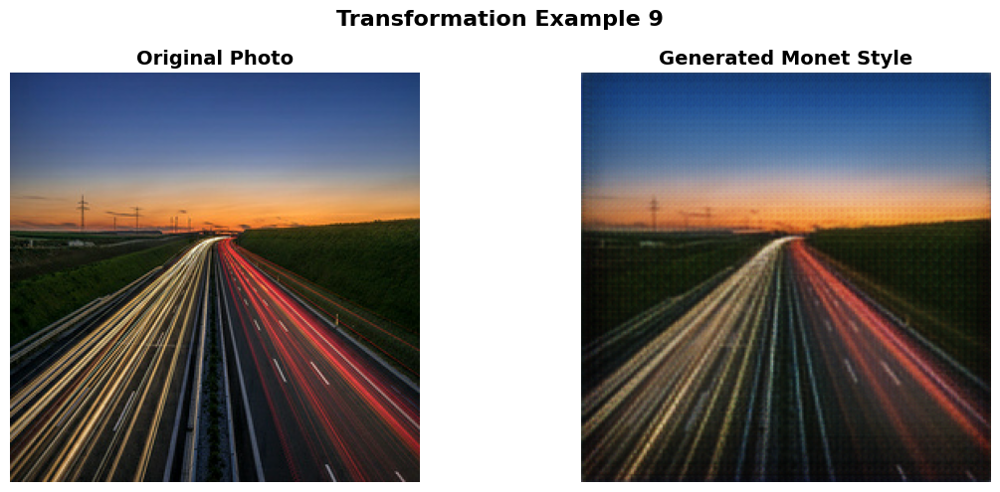

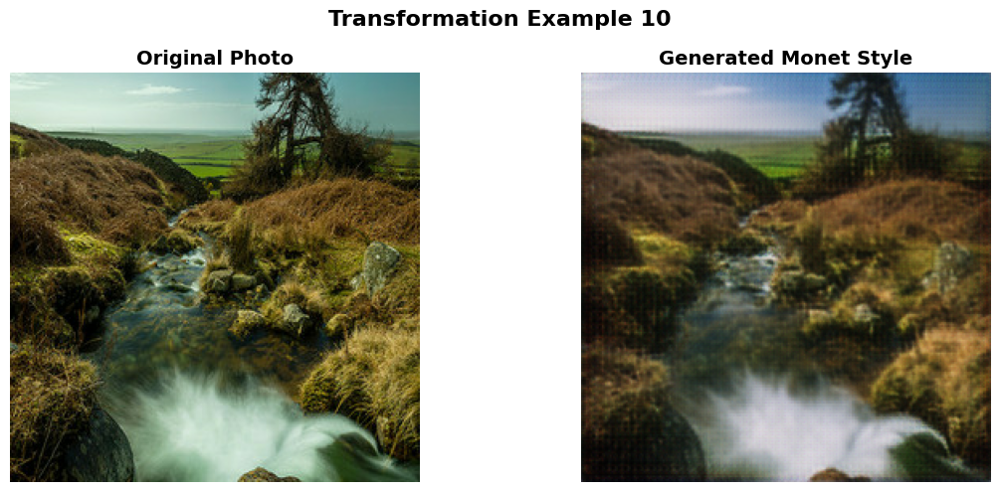


Transformations complete!


In [ ]:
print("="*60)
print("SAMPLE TRANSFORMATIONS - Photo to Monet")
print("="*60)

for i, photo in enumerate(photo_dataset.take(10)):
    generated_monet = generator_g(photo, training=False)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.title('Original Photo', fontsize=14, fontweight='bold')
    plt.imshow((photo[0] + 1) / 2.0)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Generated Monet Style', fontsize=14, fontweight='bold')
    plt.imshow((generated_monet[0] + 1) / 2.0)
    plt.axis('off')

    plt.suptitle(f'Transformation Example {i+1}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("\nTransformations complete!")

TRANSFORMATION GRID


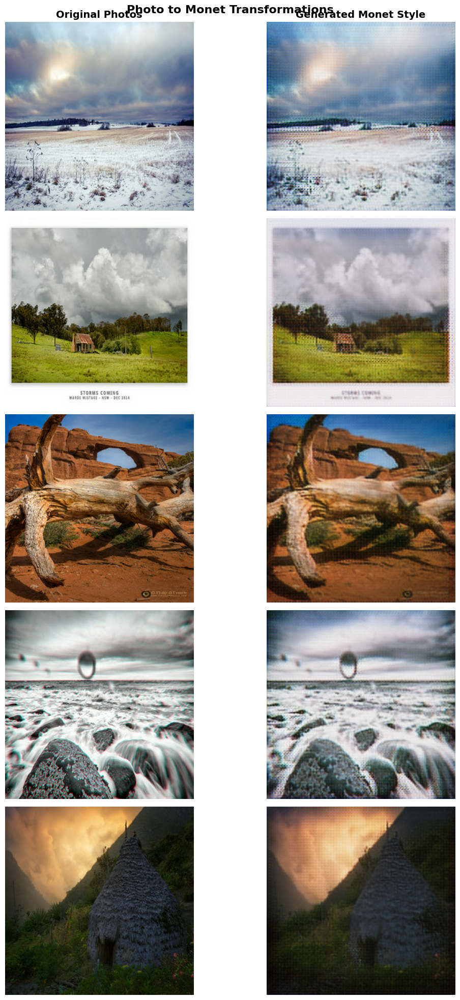

Grid complete!


In [ ]:
print("="*60)
print("TRANSFORMATION GRID")
print("="*60)

fig, axes = plt.subplots(5, 2, figsize=(12, 20))

for i, photo in enumerate(photo_dataset.take(5)):
    generated_monet = generator_g(photo, training=False)

    # Original photo
    axes[i, 0].imshow((photo[0] + 1) / 2.0)
    axes[i, 0].axis('off')
    if i == 0:
        axes[i, 0].set_title('Original Photos', fontsize=14, fontweight='bold')

    # Generated Monet
    axes[i, 1].imshow((generated_monet[0] + 1) / 2.0)
    axes[i, 1].axis('off')
    if i == 0:
        axes[i, 1].set_title('Generated Monet Style', fontsize=14, fontweight='bold')

plt.suptitle('Photo to Monet Transformations', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("Grid complete!")

## Results:


The CycleGAN model successfully learned to transform photographs into Monet-style paintings after 10 epochs of training. Training losses demonstrated stable convergence with Generator G achieving a final loss of 4.10, Generator F at 4.12, and both discriminators stabilizing around 0.63, indicating optimal balance between networks. The cycle consistency loss decreased to 2.14 and identity loss remained low at 1.03, confirming the model preserved image content while applying style transformations. Visual inspection revealed successful application of impressionist characteristics including softer color palettes, painterly textures, and reduced contrast. The model maintained structural content while effectively transferring Monet's artistic style, though some outputs displayed textural artifacts from the brief training period.


#  Discussion and Conclusion:
Overall this project successfully demonstrated CycleGAN's effectiveness for unpaired artistic style transfer, learning to apply Monet's impressionist style without paired training examples. The balanced loss values and stable training confirmed proper architectural choices including Instance Normalization, U-Net generators, and PatchGAN discriminators.

While the model successfully demonstrates artistic style transfer, several enhancements could reduce pixelation and improve output quality. Training improvements include increasing from 10 to 25-50 epochs and expanding from 100 to 200 steps per epoch, allowing the model more exposure to training data for refined feature learning. Architectural modifications such as adding residual blocks or additional convolutional layers would enable the model to capture more complex features, particularly the subtle brushstroke textures characteristic of Monet's impressionist style.

The current image resolution of 256x256 pixels, downsampled from the original 512x512, likely limits the model's ability to preserve fine details and brushwork patterns—training at higher resolution would better capture these nuances. Additionally, addressing the dataset imbalance (7,038 photos versus 300 Monet paintings) by creating a balanced dataset of 500 images per class combined with data augmentation techniques like random flips and rotations could improve style learning and reduce overfitting to the limited Monet examples. Implementing learning rate decay and perceptual loss functions would further stabilize training and produce more visually coherent results. Overall, this project successfully transformed images to paintings using generative adversarial networks.


